# <p style="background-color:green;font-family:newtimeroman;font-size:200%;color:white;text-align:center;border-radius:20px 20px;"><b>Bike Demand Analysis Project</b></p>

# <span style=" color:red">Store Sharing Project! </span>

The aim of this project is to reveal the current patterns in the data by showing the historical data of London bike shares with visualization tools.

This will allow us to X-ray the data as part of the EDA process before setting up a machine learning model.

## <span style=" color:red">Description 
    
**Features**
    
- timestamp - timestamp field for grouping the data
- cnt - the count of a new bike shares
- t1 - real temperature in C
- t2 - temperature in C “feels like”
- hum - humidity in percentage
- wind_speed - wind speed in km/h
- weather_code - category of the weather
- is_holiday - boolean field - 1 holiday / 0 non holiday
- is_weekend - boolean field - 1 if the day is weekend
- season - category field meteorological seasons: 0-spring ; 1-summer; 2-fall; 3-winter.
    
**"weather_code"** category description:

- 1 = Clear ; mostly clear but have some values with haze/fog/patches of fog/ fog in vicinity
- 2 = scattered clouds / few clouds
- 3 = Broken clouds
- 4 = Cloudy
- 7 = Rain/ light Rain shower/ Light rain
- 10 = rain with thunderstorm
- 26 = snowfall
- 94 = Freezing Fog
    
We are to  discover the data. Recognize features, detect missing values, outliers etc. Review the data from various angles in different time breakdowns. For example, visualize the distribution of bike shares by day of the week. With this graph, we will be able to easily observe and make inferences how people's behavior changes daily. Likewise, we can make hourly, monthly, seasonally etc. analyzes. In addition, we can analyze correlation of variables with a heatmap.

## <span style=" color:red"> Import Libraries, Loading the Dataset and Initial Exploration

- Load the dataset, display first few rows, check the structure of the dataset.

- Inspect the data types and missing values using **df.info()**

- Get basic statistics for numerical columns with **df.describe()**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

In [2]:
df= pd.read_csv('store_sharing.csv')
df.head()

,timestamp,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0
2,2015-01-04 02:00:00,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,3.0
3,2015-01-04 03:00:00,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,3.0
4,2015-01-04 04:00:00,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,3.0


In [4]:
df1 = df.copy()

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17414 entries, 0 to 17413
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   timestamp     17414 non-null  object 
 1   cnt           17414 non-null  int64  
 2   t1            17414 non-null  float64
 3   t2            17414 non-null  float64
 4   hum           17414 non-null  float64
 5   wind_speed    17414 non-null  float64
 6   weather_code  17414 non-null  float64
 7   is_holiday    17414 non-null  float64
 8   is_weekend    17414 non-null  float64
 9   season        17414 non-null  float64
dtypes: float64(8), int64(1), object(1)
memory usage: 1.3+ MB


In [6]:
df.isnull().sum()

timestamp       0
cnt             0
t1              0
t2              0
hum             0
wind_speed      0
weather_code    0
is_holiday      0
is_weekend      0
season          0
dtype: int64

In [7]:
df.duplicated().sum()

0

In [8]:
from skimpy import skim
skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 17414  │ │ float64     │ 8     │                                                          │
│ │ Number of columns │ 10     │ │ string      │ 1     │                                                          │
│ └───────────────────┴────────┘ │ int32       │ 1     │                                                          │
│                                └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━┳━━━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━┓  │
│ ┃ column_name         ┃ NA   ┃ NA %    ┃ mean      ┃ sd      ┃ p0      ┃ p25   ┃ p75     ┃ p100   ┃ hist     ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━╇━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━╇━━━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━┩  │
│ │ cnt                 │    0 │       0 │      1100 │    1100 │       0 │   260 │    1700 │   7900 │   █▃▁    │  │
│ │ t1                  │    0 │       0 │        12 │     5.6 │    -1.5 │     8 │      16 │     34 │  ▁▆█▄▁   │  │
│ │ t2                  │    0 │       0 │        12 │     6.6 │      -6 │     6 │      16 │     34 │  ▁▆▆█▂   │  │
│ │ hum                 │    0 │       0 │        72 │      14 │      20 │    63 │      83 │    100 │   ▁▃▆█▄  │  │
│ │ wind_speed          │    0 │       0 │        16 │     7.9 │       0 │    10 │      20 │     56 │   ▄█▅▁   │  │
│ │ weather_code        │    0 │       0 │       2.7 │     2.3 │       1 │     1 │       3 │     26 │    █▁    │  │
│ │ is_holiday          │    0 │       0 │     0.022 │    0.15 │       0 │     0 │       0 │      1 │    █     │  │
│ │ is_weekend          │    0 │       0 │      0.29 │    0.45 │       0 │     0 │       1 │      1 │  █    ▃  │  │
│ │ season              │    0 │       0 │       1.5 │     1.1 │       0 │     0 │       2 │      3 │  █ █ ██  │  │
│ └─────────────────────┴──────┴─────────┴───────────┴─────────┴─────────┴───────┴─────────┴────────┴──────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┓  │
│ ┃ column_name               ┃ NA      ┃ NA %       ┃ words per row                ┃ total words              ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━┩  │
│ │ timestamp                 │       0 │          0 │                            2 │                    34828 │  │
│ └───────────────────────────┴─────────┴────────────┴──────────────────────────────┴──────────────────────────┘  │
╰────────────────────────────────────────────────────── End ──────────────────────────────────────────────────────╯

## <span style=" color:red"> Data Cleaning: 

- Handle missing values.

- Check for duplicates and remove them if found.

- Standardize column names (if necessary) for consistent naming conventions.

- Validate data types and convert columns to appropriate types if needed.

- Look at the data type of each variable, transform timestamp in type, and set it as index.

- Make feature engineering. Extract new columns (day of the week, day of the month, hour, month, season, year etc.)

In [9]:
data_columns = {
    'timestamp': 'Datetime',
    'cnt': 'Ride_Count',
    't1': 'Actual_Temperature',
    't2': 'Feels_Like_Temperature',
    'hum': 'Humidity_Percent',
    'wind_speed': 'Wind_Speed_Km/H',
    'weather_code': 'Weather_Code',
    'is_holiday': 'Is_Holiday',
    'is_weekend': 'Is_Weekend',
    'season': 'Season_Code'
}

df.rename(columns=data_columns, inplace=True)

df.head(2)

,Datetime,Ride_Count,Actual_Temperature,Feels_Like_Temperature,Humidity_Percent,Wind_Speed_Km/H,Weather_Code,Is_Holiday,Is_Weekend,Season_Code
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0


In [10]:
df.Weather_Code.value_counts()

Weather_Code
1.0     6150
2.0     4034
3.0     3551
7.0     2141
4.0     1464
26.0      60
10.0      14
Name: count, dtype: int64

In [11]:
Weather_Code = {
    1.0: '1 : Clear / Haze / Fog',
    2.0: '2 : Scattered Clouds / Few Clouds',
    3.0: '3 : Broken Clouds',
    4.0: '4 : Cloudy',
    7.0: '7 : Rain / Light Rain Shower',
    10.0: '10 : Rain with Thunderstorm',
    26.0: '26 : Snowfall',
    94.0: '94 : Freezing Fog'
}

df['Weather_Description'] = df['Weather_Code'].map(Weather_Code)

df.head(2)

,Datetime,Ride_Count,Actual_Temperature,Feels_Like_Temperature,Humidity_Percent,Wind_Speed_Km/H,Weather_Code,Is_Holiday,Is_Weekend,Season_Code,Weather_Description
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0,3 : Broken Clouds
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0,1 : Clear / Haze / Fog


In [12]:
season_descriptions = {
    0.0: 'Spring',
    1.0: 'Summer',
    2.0: 'Fall',
    3.0: 'Winter'
}
df['season_description'] = df['Season_Code'].map(season_descriptions)

df.head(2)

,Datetime,Ride_Count,Actual_Temperature,Feels_Like_Temperature,Humidity_Percent,Wind_Speed_Km/H,Weather_Code,Is_Holiday,Is_Weekend,Season_Code,Weather_Description,season_description
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0,3 : Broken Clouds,Winter
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0,1 : Clear / Haze / Fog,Winter


## Core  Analysis 

### Look at the data type of each variable, transform timestamp in type, and set it as index.

In [13]:
df['Datetime'] = pd.to_datetime(df['Datetime'])

In [14]:
df['Is_Holiday'] = df['Is_Holiday'].astype(int)
df['Is_Weekend'] = df['Is_Weekend'].astype(int)
df['Weather_Code'] = df['Weather_Code'].astype(int)
df['Season_Code'] = df['Season_Code'].astype(int)

df.head(2)

,Datetime,Ride_Count,Actual_Temperature,Feels_Like_Temperature,Humidity_Percent,Wind_Speed_Km/H,Weather_Code,Is_Holiday,Is_Weekend,Season_Code,Weather_Description,season_description
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3,0,1,3,3 : Broken Clouds,Winter
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1,0,1,3,1 : Clear / Haze / Fog,Winter


#### Make feature engineering. Extract new columns (day of the week, day of the month, hour, month, season, year etc.)

In [15]:
df['Year'] = df['Datetime'].dt.year
df['Month'] = df['Datetime'].dt.month
df['Day'] = df['Datetime'].dt.day
df['Hour'] = df['Datetime'].dt.hour

df.head(2)

,Datetime,Ride_Count,Actual_Temperature,Feels_Like_Temperature,Humidity_Percent,Wind_Speed_Km/H,Weather_Code,Is_Holiday,Is_Weekend,Season_Code,Weather_Description,season_description,Year,Month,Day,Hour
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3,0,1,3,3 : Broken Clouds,Winter,2015,1,4,0
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1,0,1,3,1 : Clear / Haze / Fog,Winter,2015,1,4,1


###  Visualize the correlation with a heatmap

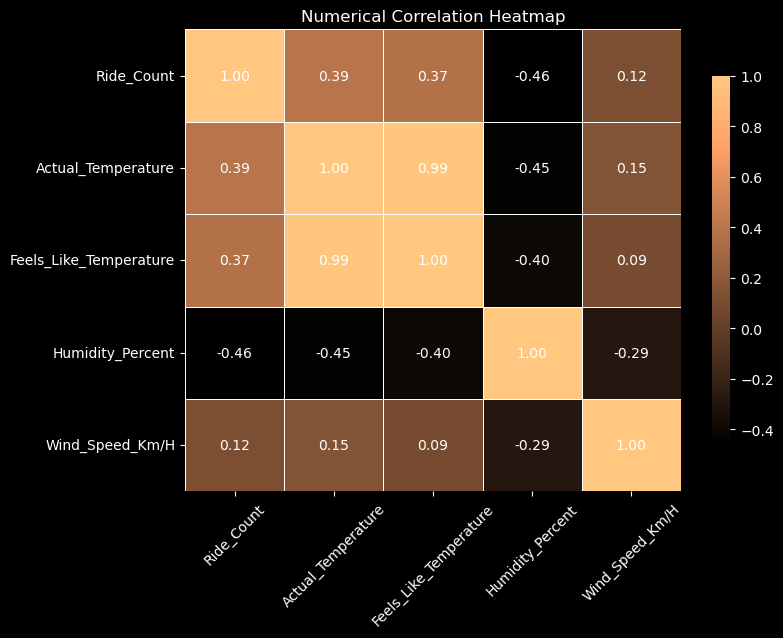

In [16]:
numerical_columns = ['Ride_Count', 'Actual_Temperature', 'Feels_Like_Temperature', 'Humidity_Percent', 'Wind_Speed_Km/H']
correlation_matrix = df[numerical_columns].corr()

plt.style.use('dark_background')  
fig = plt.figure(figsize=(8, 6))

sns.heatmap(
    correlation_matrix,
    annot=True,
    cmap="copper",  
    fmt=".2f",
    linewidths=0.5,
    cbar_kws={'shrink': 0.8},  
    annot_kws={"color": "white"}  
)
plt.title("Numerical Correlation Heatmap", color="white") 
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

## Relationship Between "Feels Like" and Actual Temperature

It was observed that there was a linear relationship of almost **100%** between **Feels Like" temperature** and **actual temperature ("Actual Temperature")**.

When the **pairwise) correlations** of all other variables were examined, **low correlation values** were detected.

### Visualize the correlation of the target variable and the other features with barplot

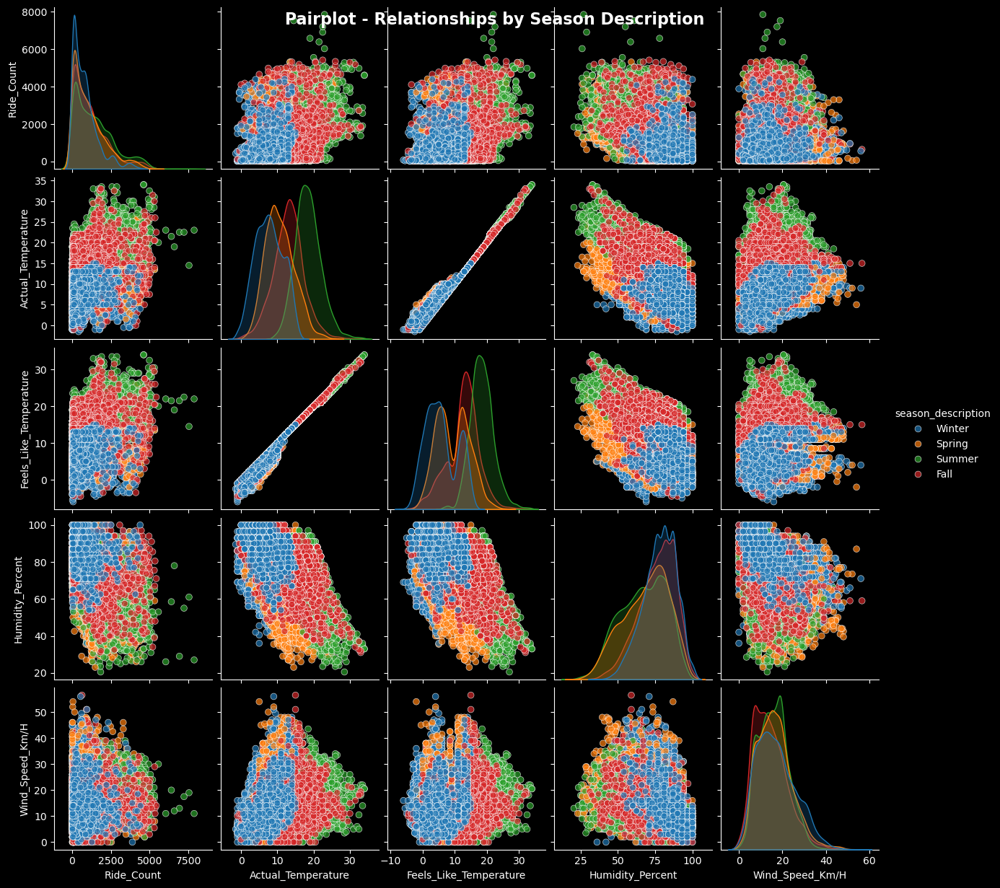

In [17]:
# colors = ['#A1C6EA', '#FF5C8D', '#F7C8A3', '#F9E6A0']  # Light blue, red, cream, pastel yellow

# Pairplot
plt.style.use('dark_background')

numerical_columns = ['Ride_Count', 'Actual_Temperature', 'Feels_Like_Temperature', 'Humidity_Percent', 'Wind_Speed_Km/H', 'season_description']

sns.pairplot(df[numerical_columns], hue="season_description", palette='tab10', plot_kws={'alpha': 0.7, 's': 40})

# Title
plt.suptitle("Pairplot - Relationships by Season Description", size=16, weight='bold')  # Title placed at the top of the plot

# Display
plt.show()

## "Ride Count" Determined as Target Variable

**"Ride Count"** was determined as the **target variable** by considering its relationships with other variables in the data.

It was observed that it was a **result variable** that could be explained by factors such as **precipitation, wind, time and air temperature**.

Correlation and regression analyses can be performed to better understand the effect of these variables on "Ride Count".

In [18]:
import plotly.graph_objects as go

def create_correlation_plot(df):
    numerical_columns = ['Ride_Count', 'Actual_Temperature', 'Feels_Like_Temperature', 
                         'Humidity_Percent', 'Wind_Speed_Km/H']
    
    correlations = df[numerical_columns].corr()['Ride_Count'].sort_values(ascending=True)
    
    correlations = correlations.drop('Ride_Count')
    
    fig = go.Figure(go.Bar(
        x=correlations,
        y=correlations.index,
        orientation='h',
        marker=dict(
            color=['blue' if val >= 0 else 'red' for val in correlations],
            line=dict(color='white', width=1)
        )
    ))

    fig.update_layout(
        title='Feature Correlations with Ride Count',
        xaxis_title='Correlation with Ride_Count',
        yaxis_title='Features',
        plot_bgcolor='black', 
        paper_bgcolor='black', 
        font=dict(color='white'),  
        xaxis=dict(showgrid=True, gridcolor='gray'),
        yaxis=dict(showgrid=True, gridcolor='gray')
    )

    fig.show()

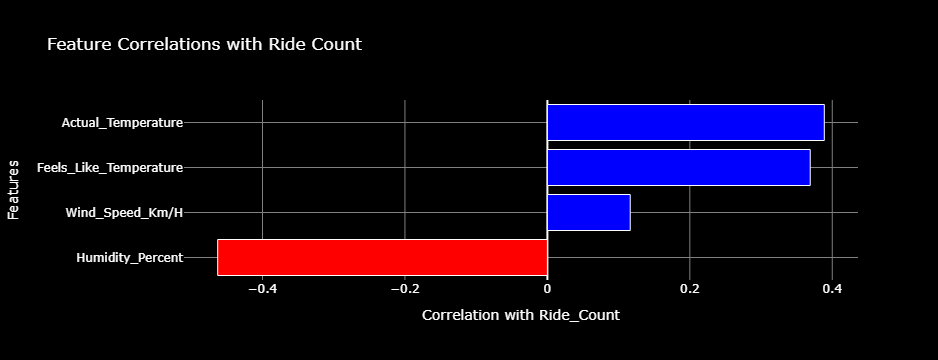

In [19]:
create_correlation_plot(df)

## Relationship of the "Ride Count" Variable with Other Variables

The relationship of the **"Ride Count"** variable with other variables is visualized using an **interactive bar plot**.

**Analysis Results:**
- **Temperature** has a **positive** relationship
- **Wind** has a **positive** relationship
- **Humidity** has a **negative** relationship

These findings provide important insights into understanding the impact of weather conditions on **Ride Count**.

### <span style=" color:red"> Plot bike shares over time use lineplot.

In [20]:
data_yearly2 = df.groupby('Datetime')['Ride_Count'].mean().reset_index()
data_yearly2.head(2)

,Datetime,Ride_Count
0,2015-01-04 00:00:00,182.0
1,2015-01-04 01:00:00,138.0


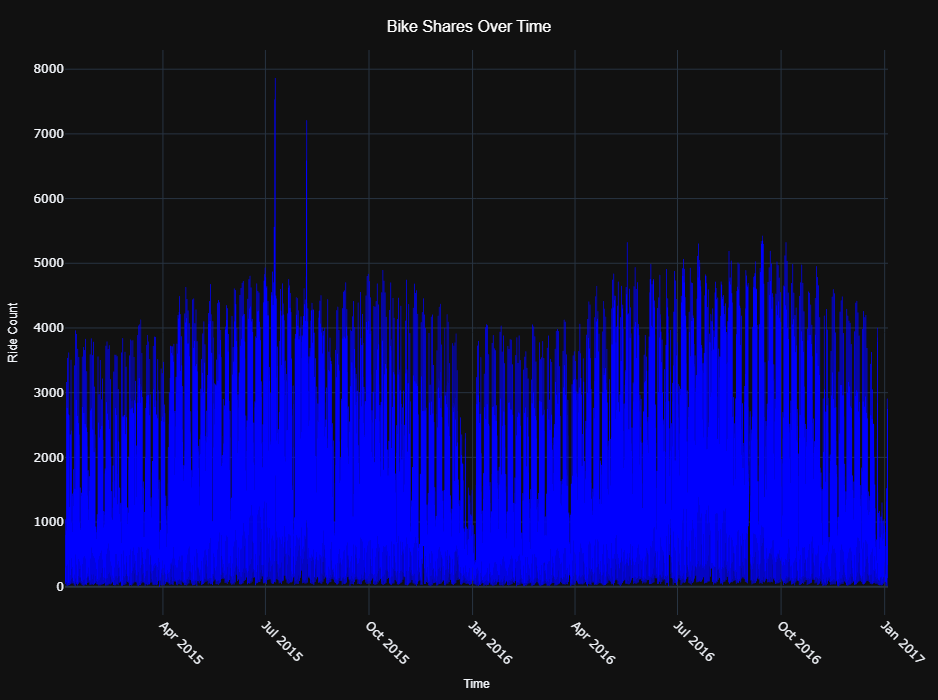

In [21]:
import plotly.express as px

fig = px.line(
    data_yearly2,
    x="Datetime",
    y="Ride_Count",
    title="Bike Shares Over Time",
    labels={"Datetime": "Time", "Ride_Count": "Ride Count"},
    template="plotly_dark",
)

fig.update_traces(
    line=dict(color='blue', width=0.7)  
)

fig.update_layout(
    title_font=dict(size=16, family="Arial", color="white"),
    title_x=0.5,  
    title_y=0.97,  
    xaxis_title_font=dict(size=12, family="Arial"),
    yaxis_title_font=dict(size=12, family="Arial"),
    xaxis=dict(tickangle=45),
    margin=dict(t=50, l=50, r=50, b=50),
    width=1200,  
    height=700,  
)

fig.show()

## Peak Points and General Change Trend

**After July 2015**, **it was observed that it peaked on two separate dates**.

**General Trend:**
- **Two distinct peak points** were detected.
- **High frequency changes** are observed, indicating sudden fluctuations in the data.

Time series analysis can be done to understand the possible factors behind these changes.

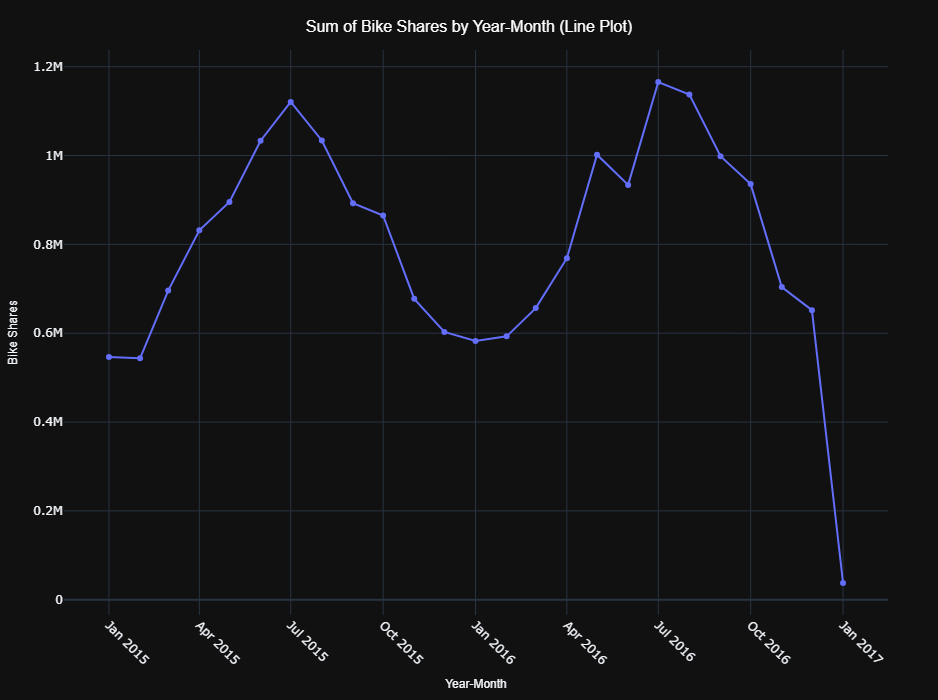

In [22]:
df['year_month'] = df['Datetime'].dt.to_period('M')
monthly_shares = df.groupby('year_month')['Ride_Count'].sum().reset_index()

monthly_shares['year_month'] = monthly_shares['year_month'].astype(str)

fig = px.line(
    monthly_shares,
    x='year_month',
    y='Ride_Count',
    title="Sum of Bike Shares by Year-Month (Line Plot)",
    labels={"year_month": "Year-Month", "Ride_Count": "Bike Shares"},
    markers=True,
    template="plotly_dark",
)
fig.update_layout(
    title_font=dict(size=16, family="Arial", color="white"),
    title_x=0.5,  
    title_y=0.97,  
    xaxis_title_font=dict(size=12, family="Arial"),
    yaxis_title_font=dict(size=12, family="Arial"),
    xaxis=dict(tickangle=45),
    margin=dict(t=50, l=50, r=50, b=50),
    width=1200,  
    height=700,  
)

fig.show()

## Change in Bike Sharing by Year and Month

**Total bike sharing** changes by year and month are visualized with an **interactive line plot**.

**Analysis Findings:**
- **Trends over time** can be clearly observed.
- Seasonal fluctuations and periodic increases/decreases can be examined in detail.

Interactive features on the graph can be used for more in-depth analysis.

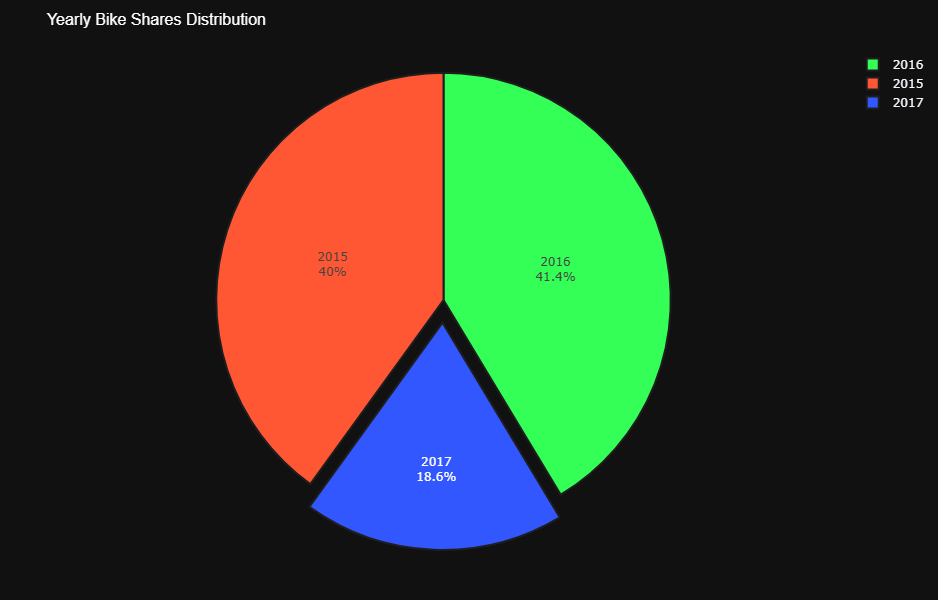

In [23]:
data_yearly = df.groupby('Year')['Ride_Count'].mean().reset_index()


fig = px.pie(
    data_yearly,
    values='Ride_Count',
    names='Year',
    title="Yearly Bike Shares Distribution",
    template="plotly_dark",
)


fig.update_traces(
    pull=[0.0, 0.0, 0.1], 
    marker=dict(
        colors=['#FF5733', '#33FF57', '#3357FF', '#FF33A1'],  
        line=dict(color='#1E1E1E', width=2)  
    ),
    textinfo='percent+label',  
)

fig.update_layout(
    title_font=dict(size=16, family="Arial", color="white"),
    legend_title=dict(font=dict(size=12, family="Arial", color="white")),
    width=800,  
    height=600, 
    margin=dict(t=50, l=50, r=50, b=50),
)

fig.show()

## Distribution of Annual Bike Shares

**Distribution of annual bike shares** is visualized with an **interactive pie chart**.

**Analysis Findings:**
- **Each year's contribution to the total share** can be clearly seen.
- **Percentage distribution of shares** helps to understand whether there is an increase or decrease in certain years.

Details can be examined better thanks to the interactive features on the chart.

### <span style=" color:red"> Plot bike shares by months and year_of_month (use lineplot, pointplot, barplot).
</span>

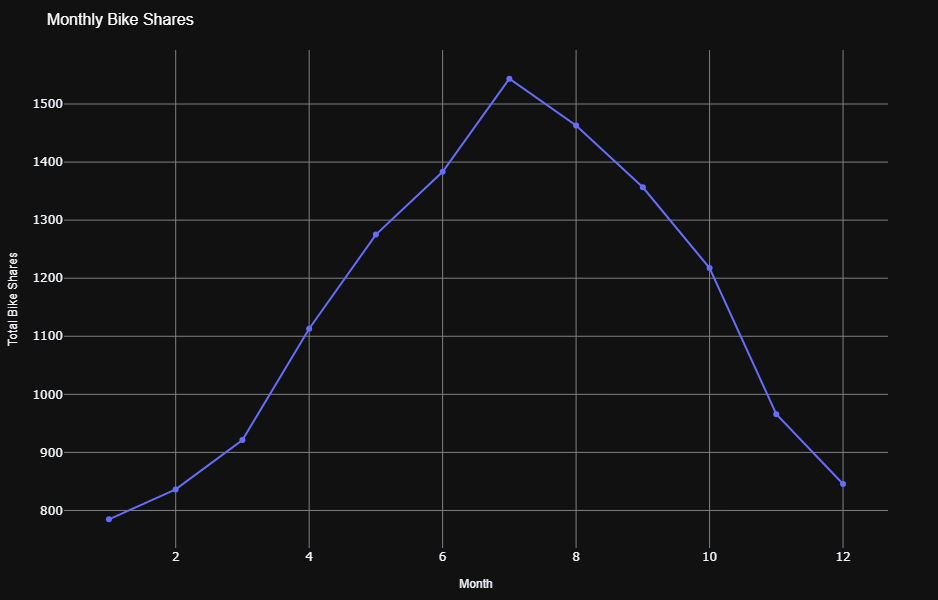

In [24]:
data_monthly = df.groupby('Month')['Ride_Count'].mean().reset_index()

fig = px.line(
    data_monthly,
    x='Month',
    y='Ride_Count',
    title="Monthly Bike Shares",
    labels={"Month": "Month", "Ride_Count": "Total Bike Shares"},
    markers=True,
    template="plotly_dark",
)

fig.update_layout(
    title_font=dict(size=16, family="Arial", color="white"),
    xaxis_title_font=dict(size=12, family="Arial"),
    yaxis_title_font=dict(size=12, family="Arial"),
    margin=dict(t=50, l=50, r=50, b=50),
    legend_title=dict(font=dict(size=12, family="Arial")),
    width=1000, 
    height=600,  
    xaxis=dict(showgrid=True, gridwidth=1, gridcolor="gray"),
    yaxis=dict(showgrid=True, gridwidth=1, gridcolor="gray"),
)

fig.show()

## Average Bike Sharing by Month

**Average bike sharing by month** data is visualized with an **interactive line plot**.

**Analysis Findings:**
- **Increase starts in spring**,
- **Reaches its peak in summer**,
- **Decreases in autumn.**

Seasonal changes provide important clues to understand bicycle usage habits.

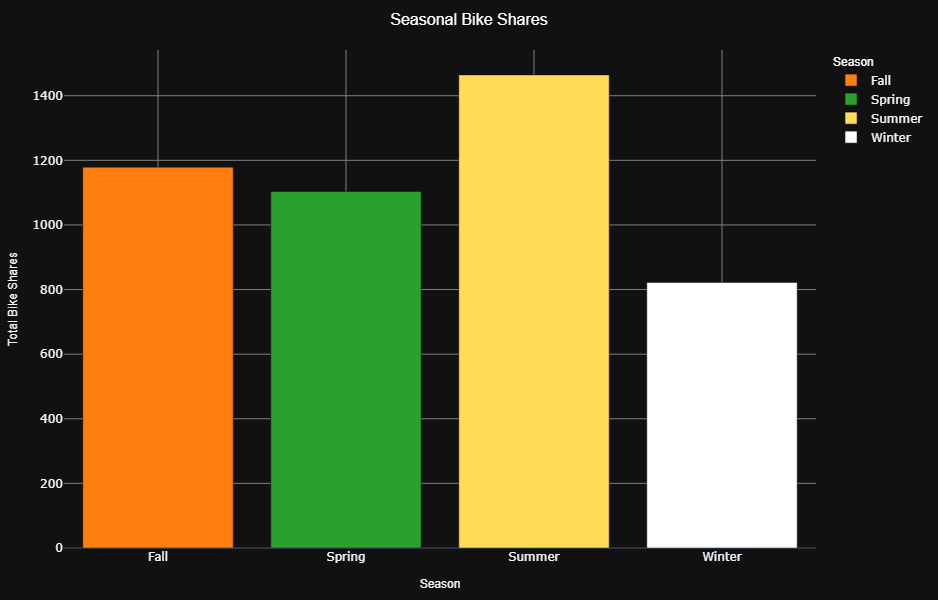

In [34]:
data_seasonal = df.groupby('season_description')['Ride_Count'].mean().reset_index()

# 4 colors from the Tab10 color palette
colors = ['#ff7f0e', '#2ca02c', '#ffdb58', '#ffffff']  # Tab10 colors

# Create bar plot
fig = px.bar(
    data_seasonal,
    x='season_description',
    y='Ride_Count',
    title="Seasonal Bike Shares",
    labels={"season_description": "Season", "Ride_Count": "Total Bike Shares"},
    template="plotly_dark", 
    color='season_description',
    color_discrete_sequence=colors  # Customize using Tab10 colors
)

# Update layout
fig.update_layout(
    title_font=dict(size=16, family="Arial", color="white"),
    title_x=0.5,  
    xaxis_title_font=dict(size=12, family="Arial"),
    yaxis_title_font=dict(size=12, family="Arial"),
    margin=dict(t=50, l=50, r=50, b=50),
    legend_title=dict(font=dict(size=12, family="Arial", color="white")),
    width=1200, 
    height=600,  
    xaxis=dict(showgrid=True, gridwidth=1, gridcolor="gray"),
    yaxis=dict(showgrid=True, gridwidth=1, gridcolor="gray"),
)

fig.show()

## Average Bike Shares by Season

**Average bike shares by season** is visualized with an **interactive bar chart**.

**Analysis Findings:**
- **Bicycle use starts to increase with spring**.
- **It reaches its highest level in summer.**
- **It starts to decrease in autumn,**
- **It drops to its lowest level in winter.**

**This chart also supports the line chart above** and clearly shows the seasonal trends in bicycle use.

### <span style=" color:red"> Plot bike shares by hours on (holidays, weekend, season).
</span>

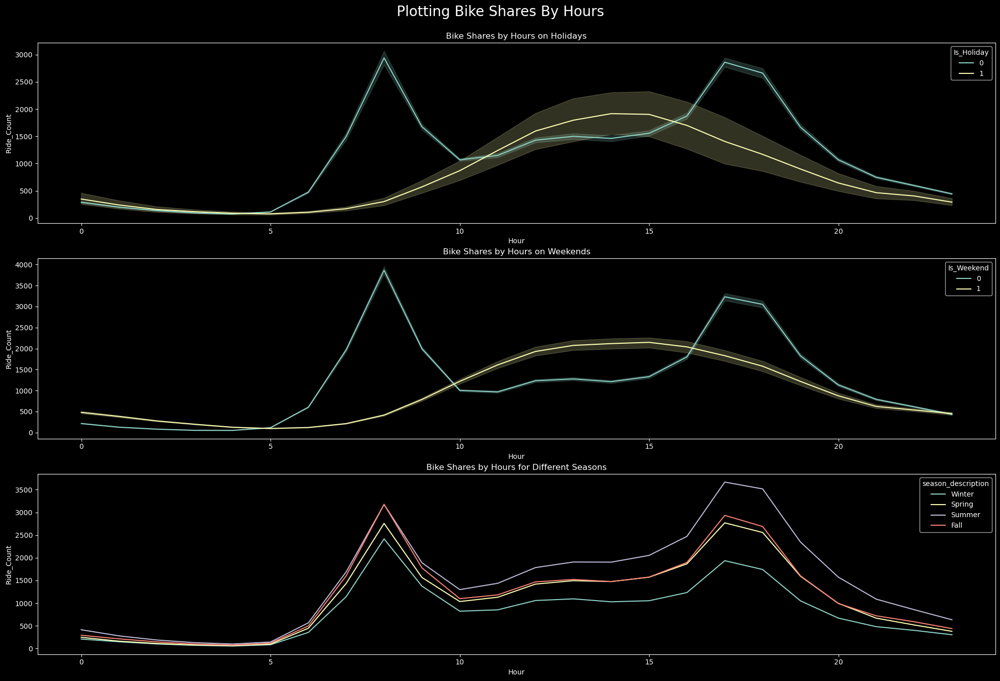

In [35]:
plt.style.use('dark_background')

fig = plt.figure(figsize=(20, 15))
fig.suptitle("Plotting Bike Shares By Hours", y=0.9, fontsize=20, color='white')

plt.subplot(3, 1, 1)
sns.lineplot(x=df.Hour, y=df.Ride_Count, hue=df.Is_Holiday)
plt.title("Bike Shares by Hours on Holidays", color='white')

plt.subplot(3, 1, 2)
sns.lineplot(x=df.Hour, y=df.Ride_Count, hue=df.Is_Weekend)
plt.title("Bike Shares by Hours on Weekends", color='white')

plt.subplot(3, 1, 3)
sns.lineplot(x=df.Hour, y=df.Ride_Count, hue=df.season_description, ci=None)
plt.title("Bike Shares by Hours for Different Seasons", color='white')

plt.tight_layout()
plt.subplots_adjust(top=0.85)
plt.show()

## Bicycle Usage Habits

**People generally preferred to use bicycles in the morning and evening hours on weekdays and non-holiday days.**

**Analysis Findings:**
- **Morning and evening traffic** shows that people use bicycles during commuting hours.

- **On weekends and holidays**, a significant **increase** in the number of bicycles is observed.

This shows that bicycles are used not only as a means of transportation but also as a **recreational vehicle**.

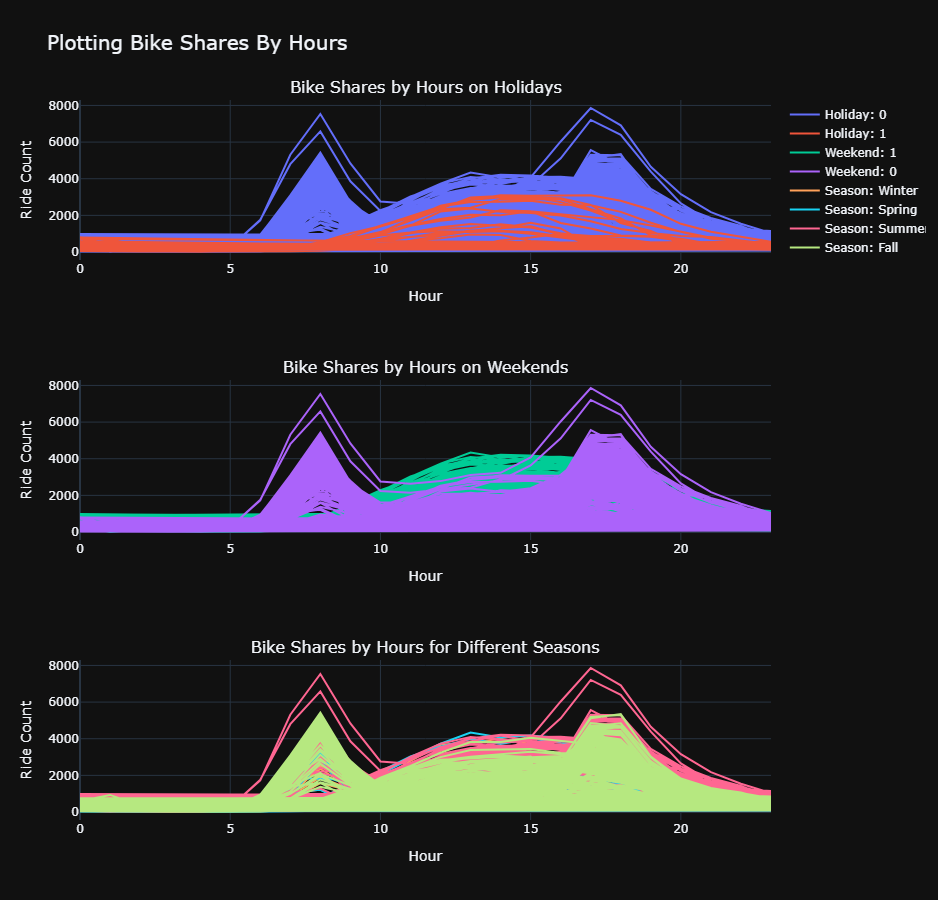

In [36]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=3, cols=1, subplot_titles=[
    "Bike Shares by Hours on Holidays",
    "Bike Shares by Hours on Weekends",
    "Bike Shares by Hours for Different Seasons"
])


for holiday in df['Is_Holiday'].unique():
    subset = df[df['Is_Holiday'] == holiday]
    fig.add_trace(
        go.Scatter(
            x=subset['Hour'],
            y=subset['Ride_Count'],
            mode='lines',
            name=f"Holiday: {holiday}",
            line=dict(width=2)
        ),
        row=1, col=1
    )


for weekend in df['Is_Weekend'].unique():
    subset = df[df['Is_Weekend'] == weekend]
    fig.add_trace(
        go.Scatter(
            x=subset['Hour'],
            y=subset['Ride_Count'],
            mode='lines',
            name=f"Weekend: {weekend}",
            line=dict(width=2)
        ),
        row=2, col=1
    )


for season in df['season_description'].unique():
    subset = df[df['season_description'] == season]
    fig.add_trace(
        go.Scatter(
            x=subset['Hour'],
            y=subset['Ride_Count'],
            mode='lines',
            name=f"Season: {season}",
            line=dict(width=2)
        ),
        row=3, col=1
    )


fig.update_layout(
    height=900,
    width=1200,
    title_text="Plotting Bike Shares By Hours",
    title_font_size=20,
    template='plotly_dark',  
    showlegend=True
)

fig.update_xaxes(title_text="Hour", row=1, col=1)
fig.update_xaxes(title_text="Hour", row=2, col=1)
fig.update_xaxes(title_text="Hour", row=3, col=1)

fig.update_yaxes(title_text="Ride Count", row=1, col=1)
fig.update_yaxes(title_text="Ride Count", row=2, col=1)
fig.update_yaxes(title_text="Ride Count", row=3, col=1)


fig.show()

## Interactive Graph

**You can view the interactive version of the above graph**.

This version allows you to examine the data in more detail and interact with different parameters.

### <span style=" color:red"> Plot bike shares by day of week.

- You may want to see whether it is a holiday or not
</span>

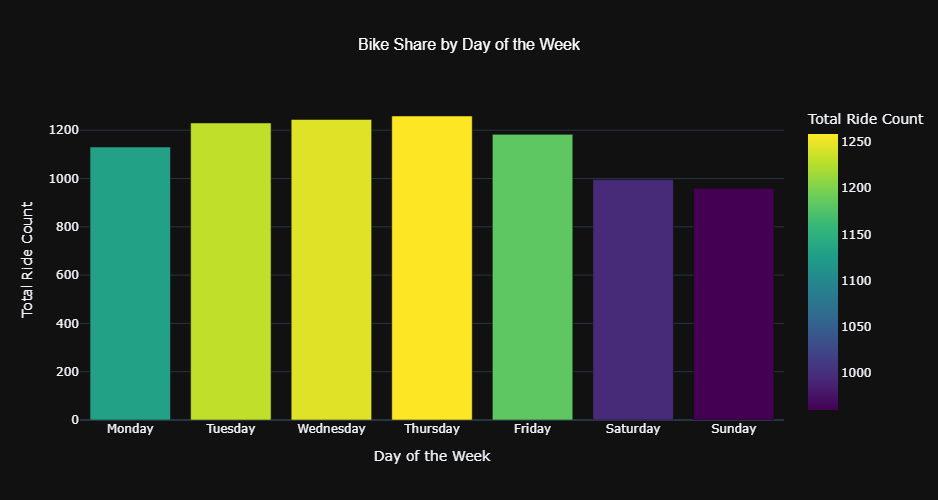

In [37]:
def create_interactive_bike_share_by_day(df):
    df['Day_of_Week'] = df['Datetime'].dt.strftime('%A')  

    bike_share_by_day = df.groupby('Day_of_Week')['Ride_Count'].mean().reset_index()

    bike_share_by_day['Day_of_Week'] = pd.Categorical(
        bike_share_by_day['Day_of_Week'],
        categories=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
        ordered=True
    )

    bike_share_by_day = bike_share_by_day.sort_values('Day_of_Week')

    fig = px.bar(
        bike_share_by_day,
        x='Day_of_Week',
        y='Ride_Count',
        title='Bike Share by Day of the Week',
        labels={'Day_of_Week': 'Day of the Week', 'Ride_Count': 'Total Ride Count'},
        color='Ride_Count',
        color_continuous_scale='Viridis',
        template='plotly_dark',  
        width=800,
        height=500
    )

    fig.update_layout(
        title_x=0.5,  
        title_font=dict(size=16, family="Arial", color="white"),
    )

    fig.show()

create_interactive_bike_share_by_day(df)

## Average Bike Shares by Day of the Week

**This graph shows average bike shares by day of the week**.

**Analysis Findings:**
- **Highest usage occurs on the middle days of the week**.
- This supports the conclusion that **bicycles are preferred for transportation to schools and workplaces**.

This trend highlights the widespread use of bicycles as a **daily means of transportation**.

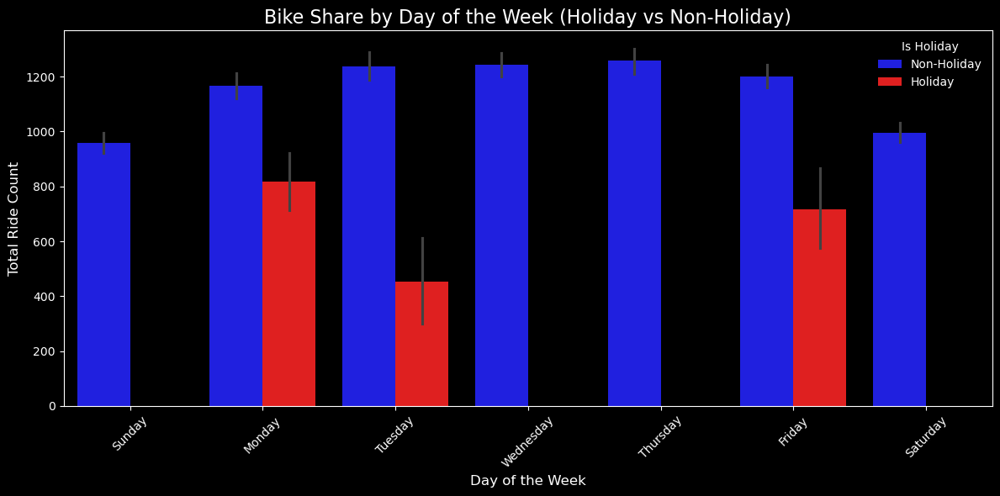

In [38]:
plt.style.use('dark_background')

plt.figure(figsize=(12, 6))


sns.barplot(
    data=df,
    x='Day_of_Week', y='Ride_Count', hue='Is_Holiday',  
    palette={0: '#0000FF', 1: '#FF0000'}  
)

plt.title('Bike Share by Day of the Week (Holiday vs Non-Holiday)', fontsize=16, color='white')
plt.xlabel('Day of the Week', fontsize=12, color='white')
plt.ylabel('Total Ride Count', fontsize=12, color='white')

handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles, ['Non-Holiday', 'Holiday'], title='Is Holiday', loc='upper right', frameon=False, facecolor='black', edgecolor='white', labelcolor='white')

plt.xticks(rotation=45, color='white')
plt.tight_layout()

# Göster
plt.show()

## Bike Share Usage by Day of the Week on Holidays and Non-Holidays

**The graph compares bike share usage by day of the week between **Holiday** and **Non-Holiday** days.

**Analysis Findings:**
- **On non-holiday days**, bike usage is generally higher and peaks on **weekdays (especially Tuesday and Wednesday).**
- **On holidays**, usage drops significantly, especially on weekdays.
- **A decrease in usage** is observed on weekends.

**This may be due to reduced transportation needs or different activities being preferred on holidays.**

### <span style=" color:red"> Plot bike shares by day of month

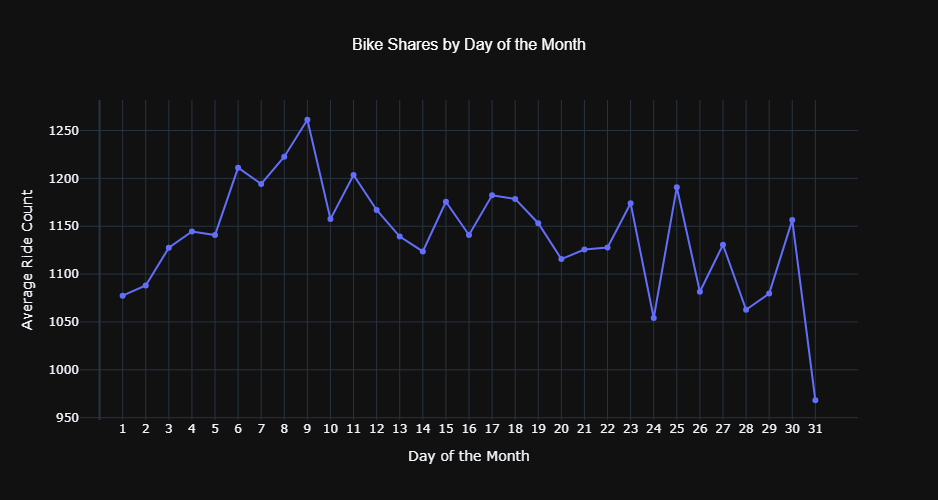

In [39]:
facet_data = df.groupby(['Day'])['Ride_Count'].mean().reset_index()

fig = px.line(
    facet_data,
    x='Day',
    y='Ride_Count',
    title='Bike Shares by Day of the Month',
    labels={'Day': 'Day of the Month', 'Ride_Count': 'Average Ride Count'},
    markers=True,  
    line_shape='linear',  
    template='plotly_dark',  
    width=800,
    height=500
)


fig.update_xaxes(tickmode='array', tickvals=list(range(1, 32)))


fig.update_layout(
    title_font_size=16,
    title_font_family='Arial',
    xaxis_title='Day of the Month',
    yaxis_title='Average Ride Count',
)

fig.update_layout(
        title_x=0.5,  
        title_font=dict(size=16, family="Arial", color="white"),
    )

fig.show()

## Monthly Bicycle Usage Trends

### **General Trend:**
- At the beginning of the month (between days 1-10), **bicycle usage tends to increase**.
- **The highest average usage** is observed around day 9.

### 2️**Middle Section (Days 11-20):**
- Between these days, a **wavy trend** is seen and no significant **decrease or increase** in the number of uses is observed.

### **Last Section (Days 21-31):**
- Towards the end of the month, a **decrease in average usage** trend is noticeable.
- **31. day**, a very **low value** was observed.

**These trends** may have been shaped by increased use at the beginning of the month due to routine activities such as work and school, instability in the middle term, and a decrease towards the end of the month due to rest and vacation periods.

### <span style=" color:red"> Plot bike shares by year

- Plot bike shares on holidays by seasons

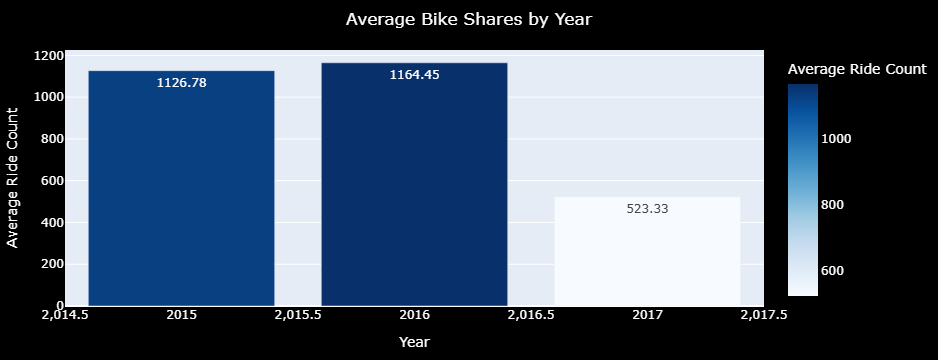

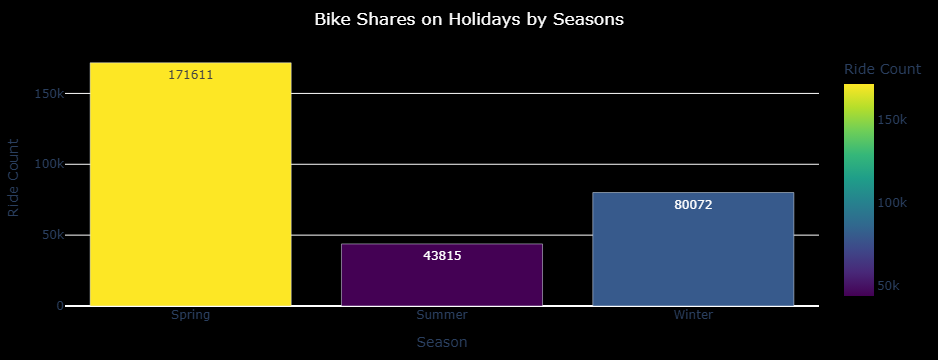

In [40]:
yearly_data = round(df.groupby('Year')['Ride_Count'].mean().reset_index(),2)

fig1 = px.bar(yearly_data, x='Year', y='Ride_Count', 
              title="Average Bike Shares by Year", 
              labels={"Year": "Year", "Ride_Count": "Average Ride Count"},
              color='Ride_Count', color_continuous_scale='Blues', 
              text='Ride_Count')

fig1.update_layout(
    paper_bgcolor="black",  
    font=dict(color="white"),  
    title_font=dict(color="white"),
    xaxis_title="Year",
    yaxis_title="Average Ride Count",
    title={"x": 0.5},
    margin=dict(t=50, b=50, l=50, r=50)
)

holiday_data = df[df['Is_Holiday'] == 1] 
seasonal_data = holiday_data.groupby('season_description')['Ride_Count'].sum().reset_index()

fig2 = px.bar(seasonal_data, x='season_description', y='Ride_Count', 
              title="Bike Shares on Holidays by Seasons", 
              labels={"season_description": "Season", "Ride_Count": "Ride Count"},
              color='Ride_Count', color_continuous_scale='Viridis', 
              text='Ride_Count')

fig2.update_layout(
    paper_bgcolor="black", 
    plot_bgcolor="black",   
    title_font=dict(color="white"),
    xaxis_title="Season",
    yaxis_title="Ride Count",
    title={"x": 0.5},
    margin=dict(t=50, b=50, l=50, r=50)
)

fig1.show()
fig2.show()

## Average Bike Shares Annually (Above Graph)

**2015:** Average bike usage was recorded as 1126.78.

**2016:** A slight increase, reaching 1164.45.

**2017:** A dramatic decrease of **523.33** was experienced.

**Comment:** This decrease may be due to the incompleteness of the dataset used in 2017, operational difficulties, or external factors (e.g. weather or infrastructure changes).

---

## Bicycle Use on Holidays by Season (Graph Below)

**Spring):** Bicycle use on holidays is at its highest level with 171,611.

**Summer):** This value drops to 43,815, representing the lowest level of use.

**Winter):** A moderate performance of 80,072 uses was seen.

**Comment:**
- The most suitable conditions for bicycle use in spring (mild weather, holiday activities) may explain this high level.
- The decrease in summer months may be related to extreme temperatures or holiday activities negatively affecting bicycle use.

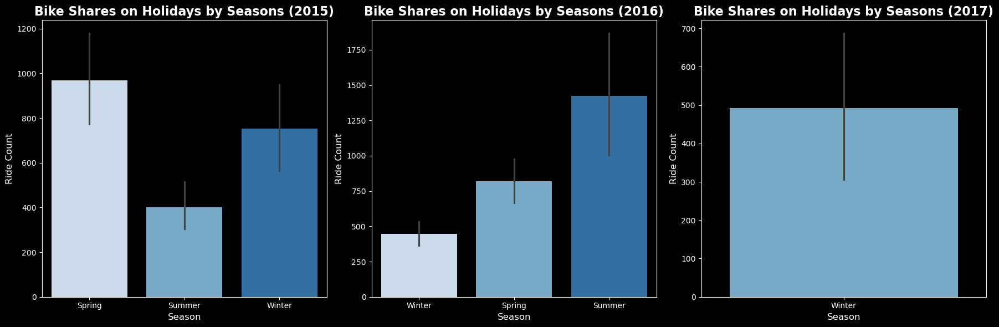

In [41]:
holiday_data_2015 = df[(df['Year'] == 2015) & (df['Is_Holiday'] == 1)]
holiday_data_2016 = df[(df['Year'] == 2016) & (df['Is_Holiday'] == 1)]
holiday_data_2017 = df[(df['Year'] == 2017) & (df['Is_Holiday'] == 1)]

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 2015 chart
sns.barplot(data=holiday_data_2015, x='season_description', y='Ride_Count', ax=axes[0], palette='Blues')
axes[0].set_title("Bike Shares on Holidays by Seasons (2015)", fontsize=16, weight='bold')
axes[0].set_xlabel("Season", fontsize=12)
axes[0].set_ylabel("Ride Count", fontsize=12)
axes[0].tick_params(axis='x', labelsize=10)
axes[0].tick_params(axis='y', labelsize=10)

# 2016 chart
sns.barplot(data=holiday_data_2016, x='season_description', y='Ride_Count', ax=axes[1], palette='Blues')
axes[1].set_title("Bike Shares on Holidays by Seasons (2016)", fontsize=16, weight='bold')
axes[1].set_xlabel("Season", fontsize=12)
axes[1].set_ylabel("Ride Count", fontsize=12)
axes[1].tick_params(axis='x', labelsize=10)
axes[1].tick_params(axis='y', labelsize=10)

# 2017 chart
sns.barplot(data=holiday_data_2017, x='season_description', y='Ride_Count', ax=axes[2], palette='Blues')
axes[2].set_title("Bike Shares on Holidays by Seasons (2017)", fontsize=16, weight='bold')
axes[2].set_xlabel("Season", fontsize=12)
axes[2].set_ylabel("Ride Count", fontsize=12)
axes[2].tick_params(axis='x', labelsize=10)
axes[2].tick_params(axis='y', labelsize=10)

plt.tight_layout()
plt.show()

## Seasonal Bicycle Usage Trends

### **2015 Year:**
**Spring holidays** were the **peak season** for bicycle usage. This trend did not continue into the summer season.

### **2016 Year:**
**Sudden increase in the summer season** may indicate that bike sharing systems are **heavily used** during the holidays or that **summer-specific events** are effective.

### **2017 Year:**
**Incomplete data** limit seasonal comparisons, but **relatively stable** usage was observed during the winter season.

### <span style=" color:red"> Visualize the distribution of bike shares by weekday/weekend with piechart and barplot
</span>

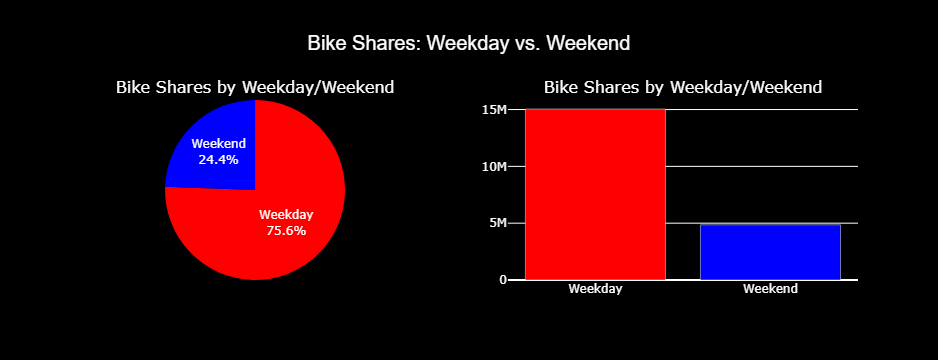

In [42]:
weekend_data = df.groupby('Is_Weekend')['Ride_Count'].sum().reset_index()
weekend_data['Is_Weekend'] = weekend_data['Is_Weekend'].replace({0: 'Weekday', 1: 'Weekend'})

# Create subplot
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=('Bike Shares by Weekday/Weekend', 'Bike Shares by Weekday/Weekend'),
    specs=[[{"type": "pie"}, {"type": "bar"}]]
)

# Pie chart 
fig.add_trace(
    go.Pie(
        labels=['Weekday', 'Weekend'],
        values=weekend_data['Ride_Count'],
        textinfo='percent+label',
        marker=dict(colors=['#FF0000', '#0000FF']),
        name='Distribution'
    ),
    row=1, col=1
)

# Bar chart
fig.add_trace(
    go.Bar(
        x=weekend_data['Is_Weekend'],
        y=weekend_data['Ride_Count'],
        marker_color=['#FF0000', '#0000FF'],
        name='Counts'
    ),
    row=1, col=2
)

# Adjust chart layout
fig.update_layout(
    title_text='Bike Shares: Weekday vs. Weekend',
    plot_bgcolor='black',
    paper_bgcolor='black',
    font=dict(color='white'),
    title_font=dict(size=18, color='white'),
    showlegend=False
)
fig.update_layout(
        title_x=0.5,  
        title_font=dict(size=20, family="Arial", color="white"),
    )

fig.show()

## Bike Sharing System: Weekday and Weekend Usage Statistics

**Data Seen in the Graph:**

### **Weekday Usage:**
- **75.6%** of the total usage occurs on weekdays.
- In the bar graph, it is observed that weekday usage is approximately **around** 12-13 million**.

### **Weekend Usage:**
- **24.4%** of the total usage occurs on weekends.
- It is determined that weekend usage is approximately **around** 4-5 million**.

**Comment:**
- This distribution shows that the bike sharing system is **primarily** used as a means of transportation for **weekday activities** such as work/school.
- The relatively low use on weekends indicates that the system is preferred for daily transportation needs rather than recreational purposes.

### <span style=" color:red"> Plot the distribution of weather code by seasons

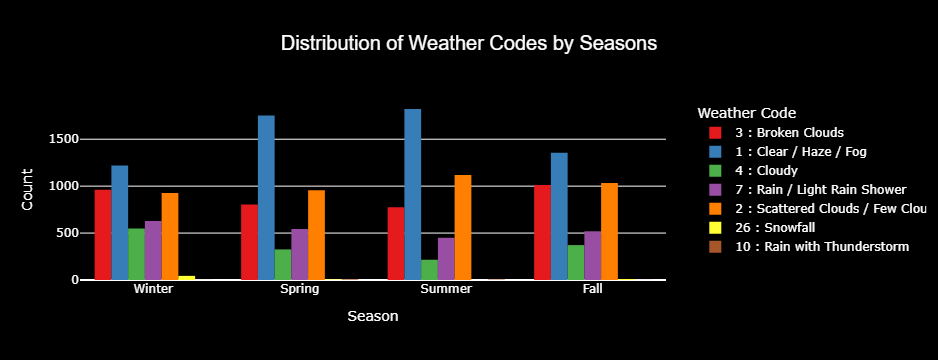

In [43]:
df['season_description'] = df['season_description'].replace({0: 'Spring', 1: 'Summer', 2: 'Fall', 3: 'Winter'})

# Plotly ile interaktif histogram
fig = px.histogram(
    df, 
    x='season_description', 
    color='Weather_Description', 
    barmode='group',
    color_discrete_sequence=px.colors.qualitative.Set1,  
    title="Distribution of Weather Codes by Seasons"
)

# Grafik düzenleme
fig.update_layout(
    xaxis_title="Season",
    yaxis_title="Count",
    legend_title_text="Weather Code",
    plot_bgcolor='black',
    paper_bgcolor='black',
    font=dict(color='white'),
    title_font=dict(size=18, color='white'),
    legend=dict(x=1.05, y=1)  
)

fig.update_layout(
        title_x=0.5,  
        title_font=dict(size=20, family="Arial", color="white"),
    )

fig.show()

## Weather Code Distribution by Season

### **Highlights:**

**Clear/Foggy/Hasty Weather (Code 1):**
- **Has the highest frequency in all seasons**, and has been observed approximately **1500 times**, especially in **spring** and **winter**.

**Partly Cloudy Weather (Code 2):**
- **Has a relatively stable** distribution in all seasons, and is between **approximately 800-1000**.

**Clear Weather (Code 4) and Rainy/Light Rainy Conditions (Code 7):**
- Has been observed **less frequently** than other weather conditions.

**Snowfall (Code 26) and Thunderstorm (Code 10):**
- **The least frequently observed** weather conditions.

### **Comment:**
- This distribution shows that the region generally has a **clear and partly cloudy** climate and **extreme weather events** are less common.

### <span style=" color:red"> Additional analyses.

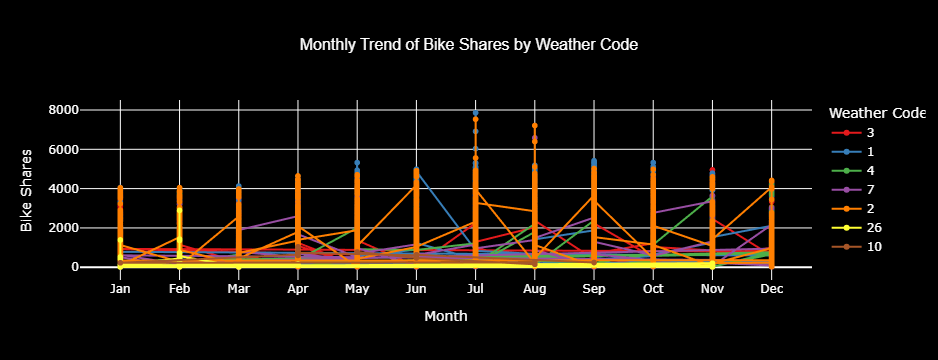

In [44]:
fig = px.line(
    df, 
    x='Month', 
    y='Ride_Count', 
    color='Weather_Code', 
    markers=True, 
    title="Monthly Trend of Bike Shares by Weather Code",
    color_discrete_sequence=px.colors.qualitative.Set1 
)

fig.update_layout(
    xaxis=dict(
        tickmode='array',
        tickvals=list(range(1, 13)),
        ticktext=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
    ),
    xaxis_title="Month",
    yaxis_title="Bike Shares",
    legend_title_text="Weather Code",
    plot_bgcolor='black',
    paper_bgcolor='black',
    font=dict(color='white'),
    title_font=dict(size=18, color='white')
)
fig.update_layout(
        title_x=0.5,  
        title_font=dict(size=16, family="Arial", color="white"),
    )
fig.show()

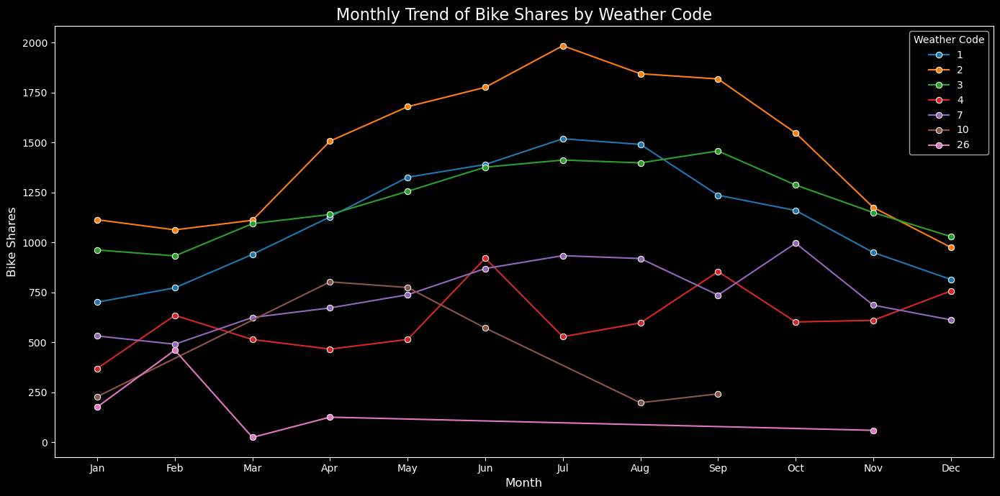

In [45]:
plt.figure(figsize=(14, 7))

plt.style.use('dark_background')


sns.lineplot(data=df, x='Month', y='Ride_Count', hue='Weather_Code', ci=None, palette='tab10', marker='o')

plt.title("Monthly Trend of Bike Shares by Weather Code", fontsize=16)
plt.xlabel("Month", fontsize=12)
plt.ylabel("Bike Shares", fontsize=12)
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])

plt.legend(title="Weather Code", loc='upper right')


plt.tight_layout()

plt.show()

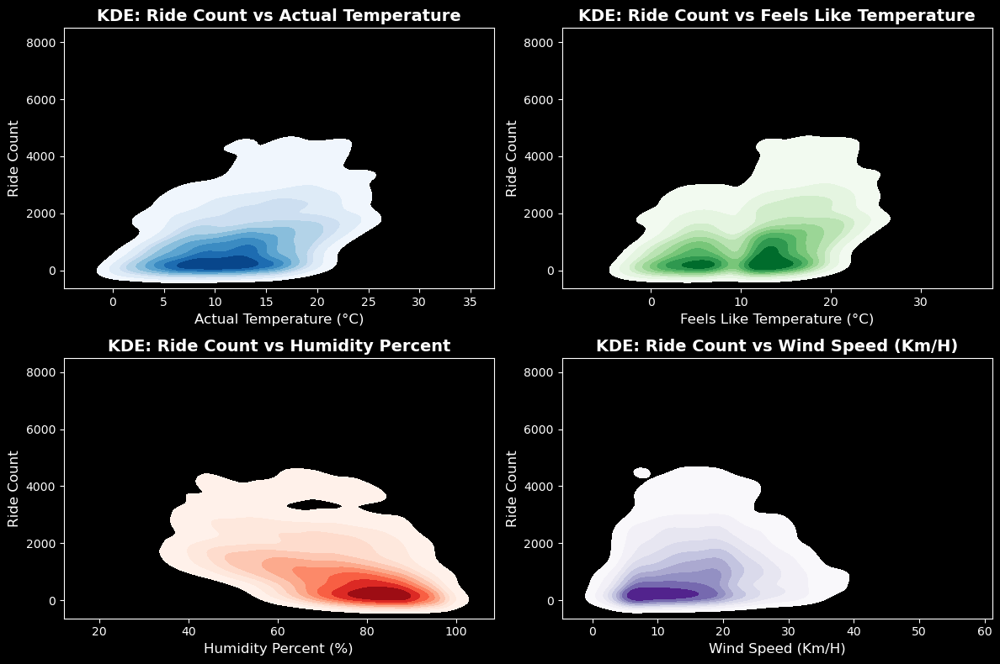

In [46]:
plt.style.use('dark_background')

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
sns.kdeplot(x=df['Actual_Temperature'], y=df['Ride_Count'], cmap='Blues', fill=True)
plt.title('KDE: Ride Count vs Actual Temperature', fontsize=14, weight='bold', color='white')
plt.xlabel('Actual Temperature (°C)', fontsize=12, color='white')
plt.ylabel('Ride Count', fontsize=12, color='white')

plt.subplot(2, 2, 2)
sns.kdeplot(x=df['Feels_Like_Temperature'], y=df['Ride_Count'], cmap='Greens', fill=True)
plt.title('KDE: Ride Count vs Feels Like Temperature', fontsize=14, weight='bold', color='white')
plt.xlabel('Feels Like Temperature (°C)', fontsize=12, color='white')
plt.ylabel('Ride Count', fontsize=12, color='white')

plt.subplot(2, 2, 3)
sns.kdeplot(x=df['Humidity_Percent'], y=df['Ride_Count'], cmap='Reds', fill=True)
plt.title('KDE: Ride Count vs Humidity Percent', fontsize=14, weight='bold', color='white')
plt.xlabel('Humidity Percent (%)', fontsize=12, color='white')
plt.ylabel('Ride Count', fontsize=12, color='white')

plt.subplot(2, 2, 4)
sns.kdeplot(x=df['Wind_Speed_Km/H'], y=df['Ride_Count'], cmap='Purples', fill=True)
plt.title('KDE: Ride Count vs Wind Speed (Km/H)', fontsize=14, weight='bold', color='white')
plt.xlabel('Wind Speed (Km/H)', fontsize=12, color='white')
plt.ylabel('Ride Count', fontsize=12, color='white')

plt.tight_layout()


plt.show()

<div class="alert alert-info alert-warning ">

# <span style=" color:red">Conclusions

# Results
- The “Bicycle Demand Visualization Project” effectively examines the factors that affect bike sharing demand using visualization techniques and data analysis. Key findings from the project include:

## Seasonal and Temporal Patterns:
- The analysis showed clear temporal trends in bike demand, with higher usage observed in certain months and seasons. Bike usage is more intense in the summer months, consistent with favorable weather conditions.
- Weekday and weekend demand patterns differ, reflecting weekday workdays and weekend recreational activities.

## Impact of Weather Conditions:
- Weather conditions, particularly temperature, humidity, and precipitation, significantly affect bike usage. While warmer weather is positively correlated with higher demand, adverse weather conditions such as heavy rain lead to a significant decrease in usage.

## Analysis of User Behavior:
- Usage patterns among users vary. Users contribute significantly to weekday demand, which is likely due to their daily commute. In contrast, users tend to be less active on weekends and holidays.

## Impact of Holidays and Special Events:
- The data revealed that bicycle use decreased during holidays and weekends. This could be due to reduced transportation needs or different activities during holidays.
## Importance of Data Visualization:
- The project emphasizes the importance of visualization in identifying trends and extracting actionable insights. Graphs, heatmaps, and interactive dashboards provided a clear understanding of complex data.

# Recommendations
## Optimizing Resource Allocation:
- Based on temporal and weather trends, bike sharing services can optimize the allocation of resources; for example, repositioning bikes and scheduling maintenance during off-peak times.

## Strategies to Adapt to Weather Conditions:
- Offering promotions or incentives during adverse weather conditions can help maintain demand. Additionally, offering weather-resistant bikes and protective gear can increase user satisfaction.

## Converting Users to Registered Users:
- Strategies such as discounts for memberships or targeted marketing can increase user satisfaction with bike-sharing services.

## Infrastructure Planning:
- Identifying high-demand areas and peak times can guide infrastructure work decisions, ensuring bikes are available where and when they are in highest demand.

## Sustainability Initiatives:
- Highlighting the environmental benefits of bike-sharing can further encourage use and align with global sustainability goals.

- This project demonstrates that data-driven insights can improve operational efficiency, enhance user experiences, and support sustainable transportation solutions.